### PUC Minas - Pontifícia Universidade Católica de Minas Gerais
# Pós Graduação em Ciência de Dados e Big Data
# Trabalho de conclusão de curso

**Luciana Sampaio dos Santos **

> Matricula : 1340800




## Importando bibliotecas do Python






In [1]:
import numpy as np
import pandas as pd
import pickle as pk
import seaborn as sns # Biblioteca de Visualização
import matplotlib.pyplot as plt # Biblioteca de Visualização
import itertools

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import jaccard_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split,cross_validate,GridSearchCV
from sklearn import svm
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer 
from sklearn.model_selection import StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler

#Biblioteca para plotar graficos
import cufflinks as cf
import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected = True)

In [2]:
#Bibliotecas para informações e warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 100)
from termcolor import colored
constraints = ['#581845', '#C70039']
metric_constraints = ['#2ECC71','#34495E','#D0D3D4']
cat_feat_constraints = ['#7FB3D5','#76D7C4','#F7DC6F','#85929E','#283747']


In [3]:
import sys
print(sys.version)

3.9.16 (main, Dec  7 2022, 01:11:51) 
[GCC 9.4.0]


In [4]:
diabetes = pd.read_csv('/content/drive/MyDrive/Diabetes/diabetes.csv', sep=',', encoding='iso-8859-1')

# **Analise exploratório dos dados**

In [5]:
diabetes.shape

(768, 9)

In [6]:
#Analisando as Colunas no dataset
diabetes.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI',
       'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [7]:
diabetes.duplicated().value_counts()

False    768
dtype: int64

In [8]:
#Anlisando o descrição do dataset
diabetes.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.00,768.00,768.00,768.00,768.00,768.00,768.00,768.00,768.00
mean,3.85,120.89,69.11,20.54,79.80,31.99,0.47,33.24,0.35
std,3.37,31.97,19.36,15.95,115.24,7.88,0.33,11.76,0.48
min,0.00,0.00,0.00,0.00,0.00,0.00,0.08,21.00,0.00
25%,1.00,99.00,62.00,0.00,0.00,27.30,0.24,24.00,0.00
50%,3.00,117.00,72.00,23.00,30.50,32.00,0.37,29.00,0.00
75%,6.00,140.25,80.00,32.00,127.25,36.60,0.63,41.00,1.00
max,17.00,199.00,122.00,99.00,846.00,67.10,2.42,81.00,1.00


In [9]:
diabetes.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.60,0.63,50,1
1,1,85,66,29,0,26.60,0.35,31,0
2,8,183,64,0,0,23.30,0.67,32,1
3,1,89,66,23,94,28.10,0.17,21,0
4,0,137,40,35,168,43.10,2.29,33,1


Criando um função de Classificação de dados

In [10]:

#Classificar e Categorizar as Colunas do Dataset
def grab_col_names(diabetes, cat_th=10, car_th=20):
         
    # cat_cols, cat_but_car
    cat_cols = [col for col in diabetes.columns if diabetes[col].dtypes == "O"]
    num_but_cat = [col for col in diabetes.columns if diabetes[col].nunique() < cat_th and
                   diabetes[col].dtypes != "O"]
    cat_but_car = [col for col in diabetes.columns if diabetes[col].nunique() > car_th and
                   diabetes[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in diabetes.columns if diabetes[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print(" RESULT ".center(30, '~'),"\n")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}',"\n")
    print("".center(30, '~'))

    return cat_cols, num_cols, cat_but_car

cat_cols, num_cols, cat_but_car = grab_col_names(diabetes)

~~~~~~~~~~~ RESULT ~~~~~~~~~~~ 

cat_cols: 1
num_cols: 8
cat_but_car: 0
num_but_cat: 1 

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [11]:
cat_cols

['Outcome']

In [12]:
num_cols

['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age']

In [13]:
# Cardinalidade
def check_classes(diabetes):  
    dict = {}
    for i in list(diabetes.columns):
        dict[i] = diabetes[i].value_counts().shape[0]

    unq = pd.DataFrame(dict,index=["Unique Count"]).transpose().sort_values(by="Unique Count", ascending=False)
    return unq

check_classes(diabetes)

,Unique Count
DiabetesPedigreeFunction,517
BMI,248
Insulin,186
Glucose,136
Age,52
SkinThickness,51
BloodPressure,47
Pregnancies,17
Outcome,2


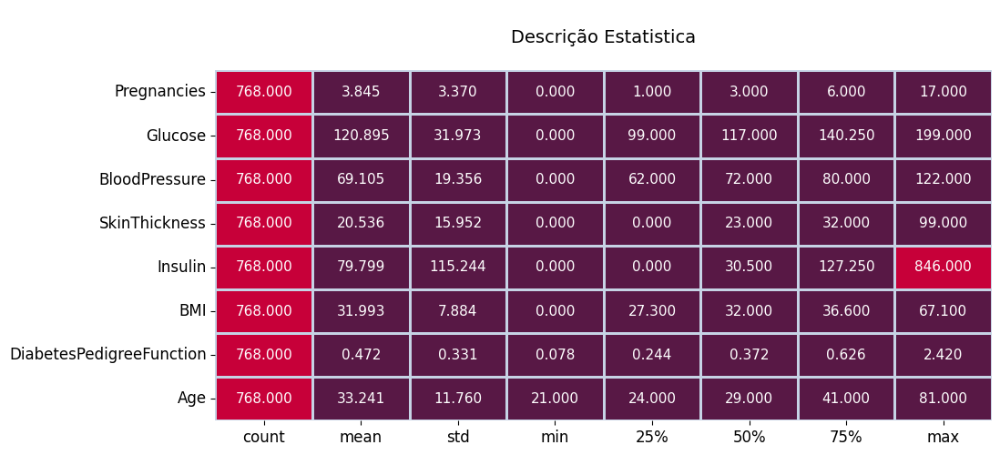

In [14]:
def descriptive_statistics(df):
    describe_ = df.describe().T
    describe_df = pd.DataFrame(index=df.columns,
                               columns=describe_.columns,
                               data=describe_)

    f, ax = plt.subplots(figsize=(11,5))
    sns.heatmap(describe_df,
                annot=True,
                cmap= constraints,
                fmt='.3f',
                ax=ax,
                linecolor='#C6D3E5',
                linewidths=2,
                cbar=False,
                annot_kws={"size": 11})
    plt.xticks(size=12)
    plt.yticks(size=12,
               rotation=0)
    plt.title("\nDescrição Estatistica\n", size=14)
    plt.show()


num_desc = diabetes[num_cols]
descriptive_statistics(num_desc)

In [15]:
#Verificando se o dataset possui valores Nulos
diabetes.isnull ( ) .sum ( )

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [16]:
# Podemos inclusive verificar apenas a média
diabetes.mean()

Pregnancies                  3.85
Glucose                    120.89
BloodPressure               69.11
SkinThickness               20.54
Insulin                     79.80
BMI                         31.99
DiabetesPedigreeFunction     0.47
Age                         33.24
Outcome                      0.35
dtype: float64

In [17]:
# E o desvio padrão
diabetes.std()

Pregnancies                  3.37
Glucose                     31.97
BloodPressure               19.36
SkinThickness               15.95
Insulin                    115.24
BMI                          7.88
DiabetesPedigreeFunction     0.33
Age                         11.76
Outcome                      0.48
dtype: float64

In [18]:
#revalidando os dados nulos
diabetes.isnull().values.any()

False

In [19]:
#Verificando o tamanho do dataset
diabetes.size

6912

In [20]:
# Quantidade de linhas no dataset
total_rows=len(diabetes.axes[0])
print("Numero de Linhas: "+str(total_rows))

Numero de Linhas: 768


In [21]:
#Realizando uma análise de variância do dataset
diabetes.var()

Pregnancies                   11.35
Glucose                     1022.25
BloodPressure                374.65
SkinThickness                254.47
Insulin                    13281.18
BMI                           62.16
DiabetesPedigreeFunction       0.11
Age                          138.30
Outcome                        0.23
dtype: float64

In [22]:
#verificando os ultimos registros
diabetes.tail()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
763,10,101,76,48,180,32.90,0.17,63,0
764,2,122,70,27,0,36.80,0.34,27,0
765,5,121,72,23,112,26.20,0.24,30,0
766,1,126,60,0,0,30.10,0.35,47,1
767,1,93,70,31,0,30.40,0.32,23,0


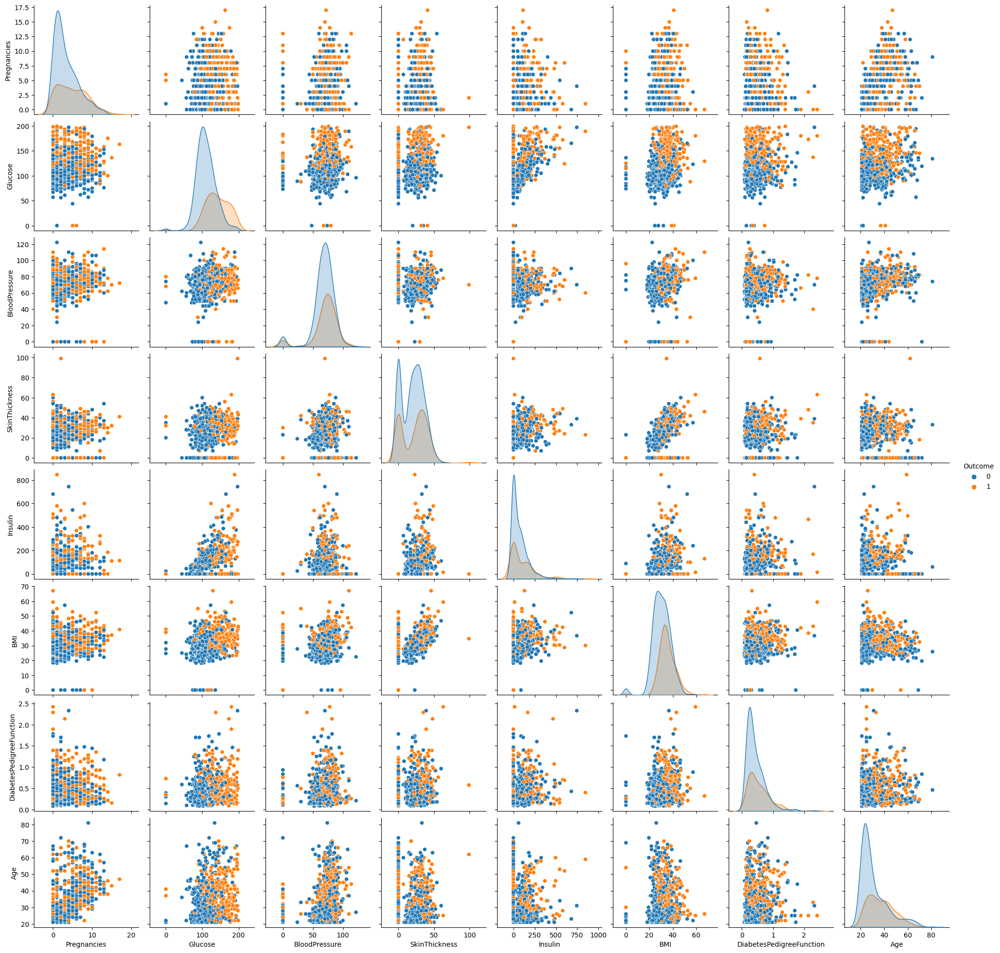

In [23]:
#Plotando os dados 
sns.pairplot(diabetes, hue= 'Outcome',vars = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'])


[Text(0.5, 1.0, 'Relação Entre a Glicose e Insulina')]

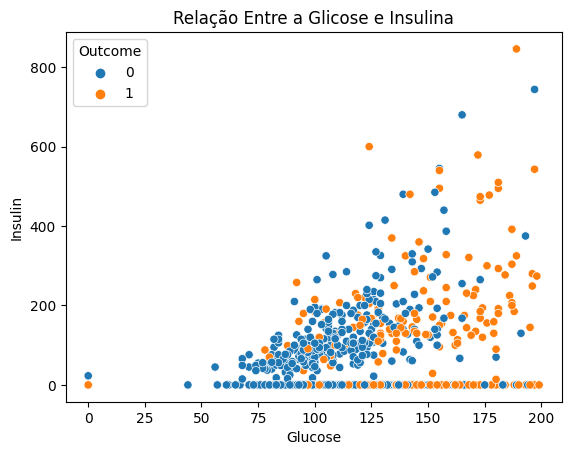

In [24]:
#Analise de correlação entre Glicose e Insulina
sns.scatterplot(x = 'Glucose', y = 'Insulin', hue = 'Outcome', data = diabetes).set(title = 'Relação Entre a Glicose e Insulina')

[Text(0.5, 1.0, 'Relação Entre a Pressão Arterial  e Glicose')]

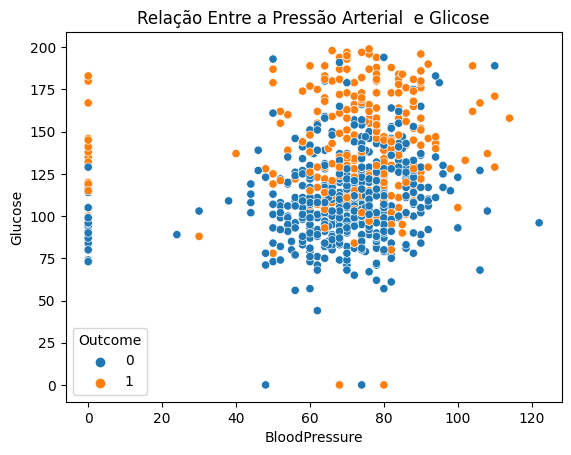

In [25]:
#Plotando relação entre Pressão Arterial e Glicose
sns.scatterplot(x = 'BloodPressure', y = 'Glucose', hue = 'Outcome', data = diabetes).set(title = 'Relação Entre a Pressão Arterial  e Glicose')

(array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(1, 0, 'Pregnancies'),
  Text(2, 0, 'Glucose'),
  Text(3, 0, 'BloodPressure'),
  Text(4, 0, 'SkinThickness'),
  Text(5, 0, 'Insulin'),
  Text(6, 0, 'BMI'),
  Text(7, 0, 'DiabetesPedigreeFunction'),
  Text(8, 0, 'Age'),
  Text(9, 0, 'Outcome')])

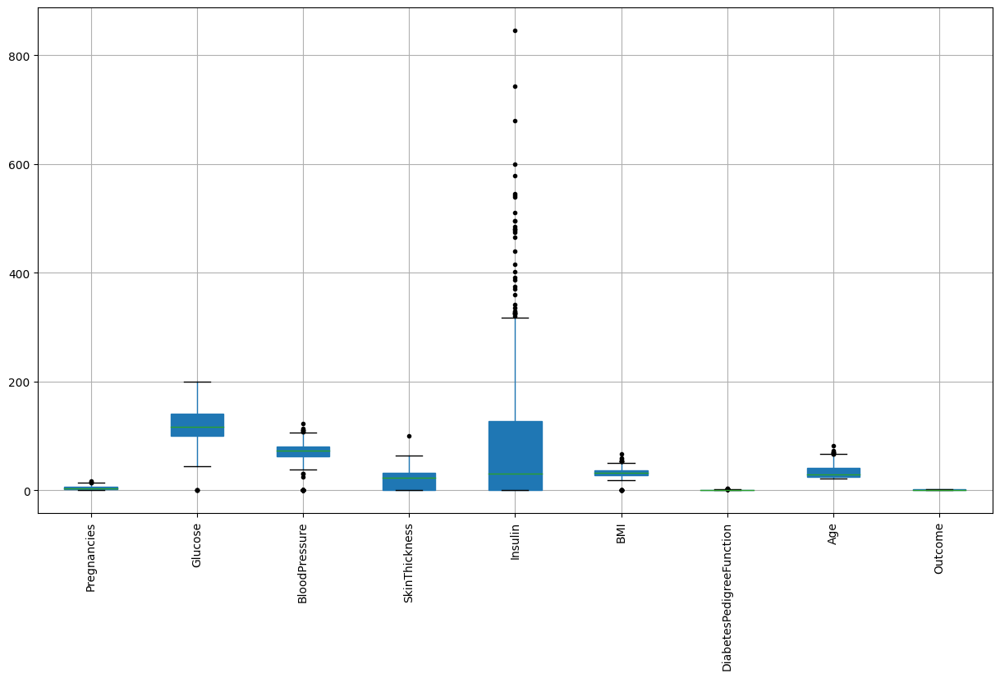

In [26]:
plt.subplots(figsize=(15,8))
diabetes.boxplot(patch_artist=True, sym="k.")
plt.xticks(rotation=90)

<Axes: >

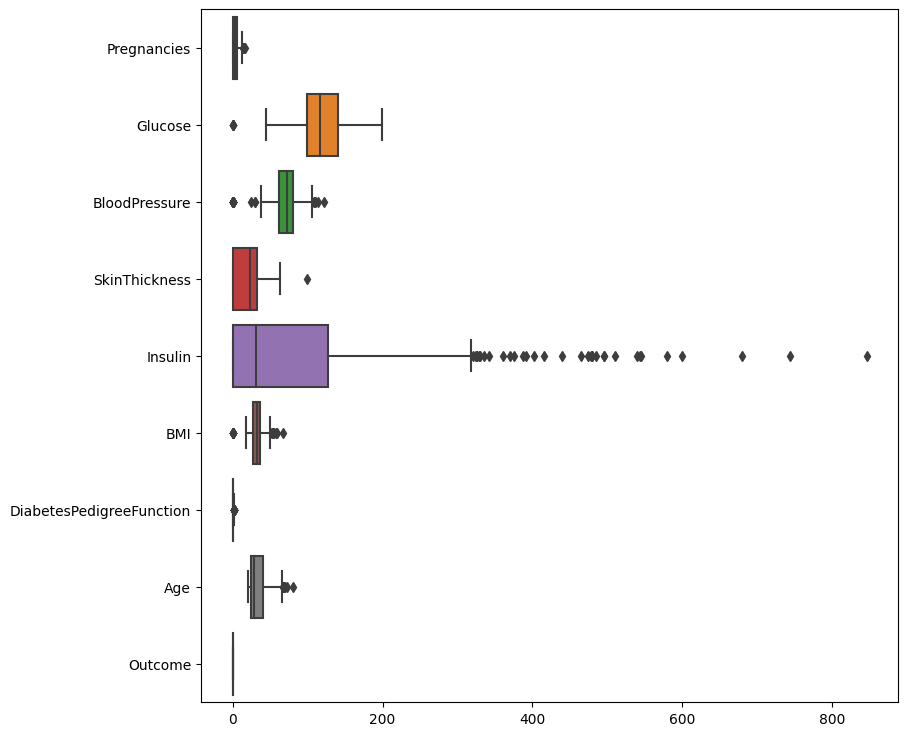

In [27]:
#Plotando os dados para verificar os outliers
plt.figure(figsize=(9,9 ))
sns.boxplot(data=diabetes, orient="h")  # Boxplot

<Axes: xlabel='Age', ylabel='count'>

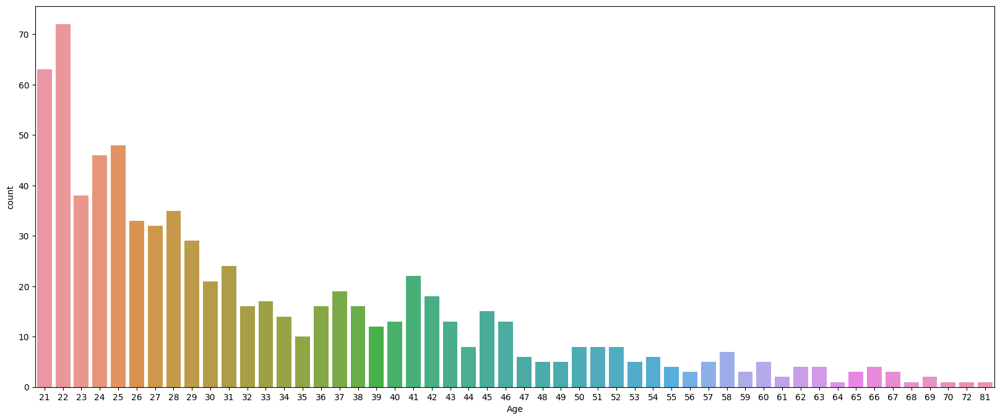

In [28]:
# Visualizar a idade dos dados tratados de Modo gráfico
plt.figure(figsize = (20,8))
sns.countplot(x = diabetes['Age'])

In [29]:
#Agrupamento de pessoas com e sem diabetes
print(diabetes[diabetes.SkinThickness == 0].groupby('Outcome')['Age'].count())

Outcome
0    139
1     88
Name: Age, dtype: int64


<Axes: xlabel='Pregnancies', ylabel='Density'>

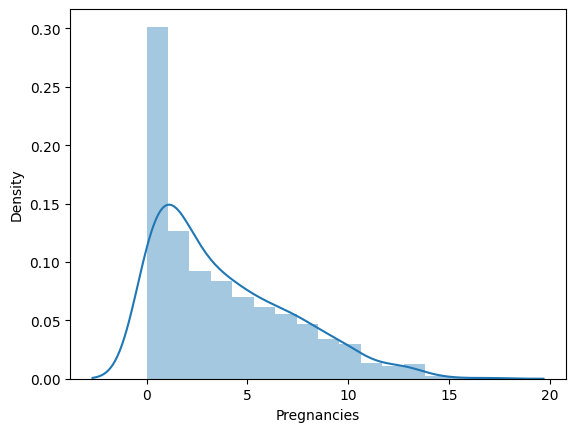

In [30]:
sns.distplot(diabetes['Pregnancies'])

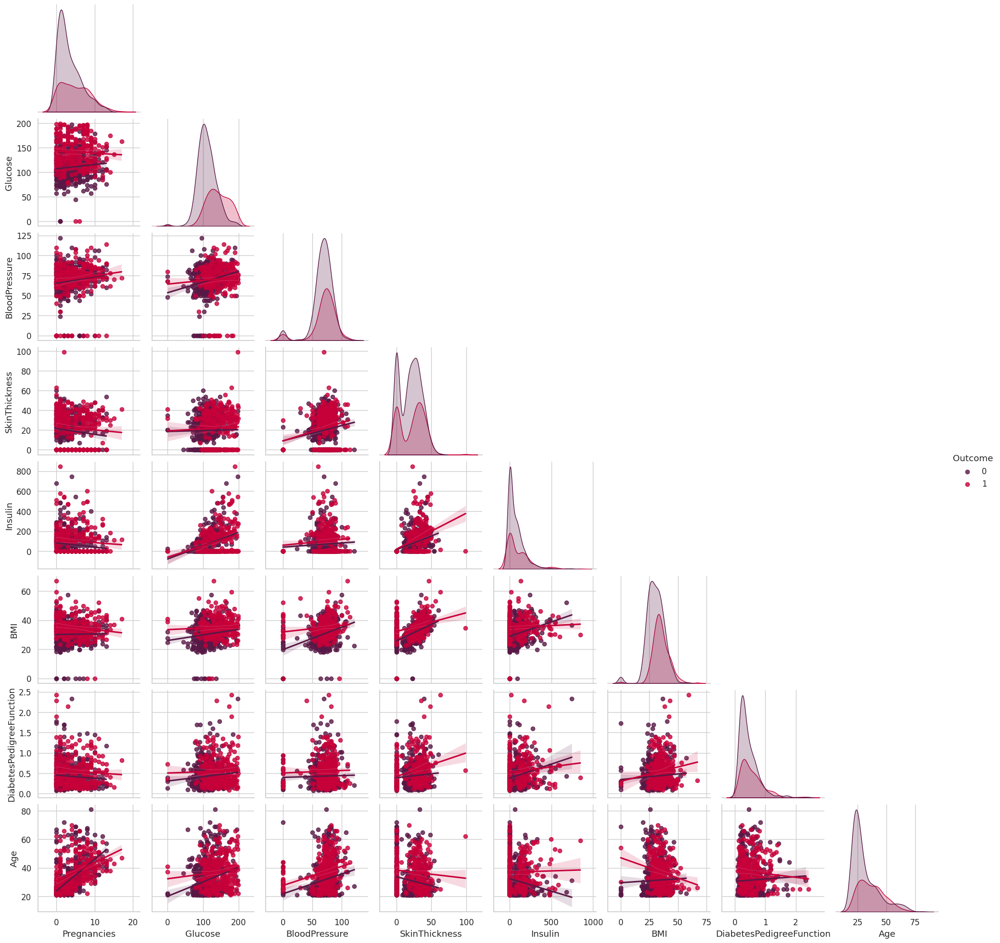

In [31]:
#Analise exploratorio de modo grafico. 
sns.set(font_scale=1.1, 
        style="whitegrid", 
        palette= constraints,
        font="sans-serif")
sns.pairplot(diabetes,
             hue='Outcome',
             corner = True, 
             kind = 'reg');

In [32]:
# Verificando pacientes com Nível de insulina 0 
print("Total : ", diabetes[diabetes.Insulin == 0].shape[0])

Total :  374


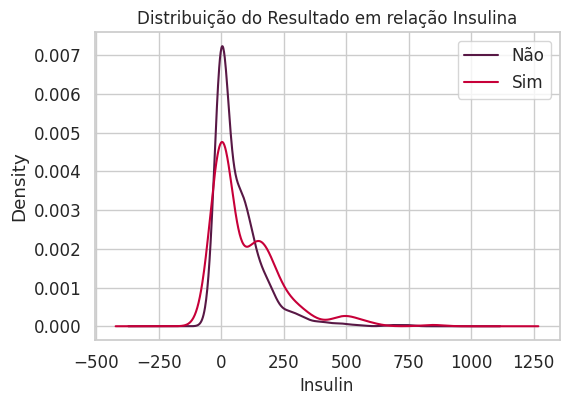

In [33]:
# Criando uma visualização para comparar o resultado dos registros com pacientes diabetes e não diabeticos
plt.figure(figsize=(6,4))

# Plot
diabetes.Insulin[diabetes.Outcome==0].plot(kind='kde')
diabetes.Insulin[diabetes.Outcome==1].plot(kind='kde')

# Plotando
plt.xlabel('Insulin', fontsize=12)
plt.title('Distribuição do Resultado em relação Insulina', fontsize=12)
plt.legend(('Não', 'Sim'), loc='best')
plt.show()

In [34]:
#Validando o quantitativo de não diabéticos e diabéticos
diabetes['Outcome'].value_counts()

0    500
1    268
Name: Outcome, dtype: int64

<Axes: xlabel='Outcome', ylabel='count'>

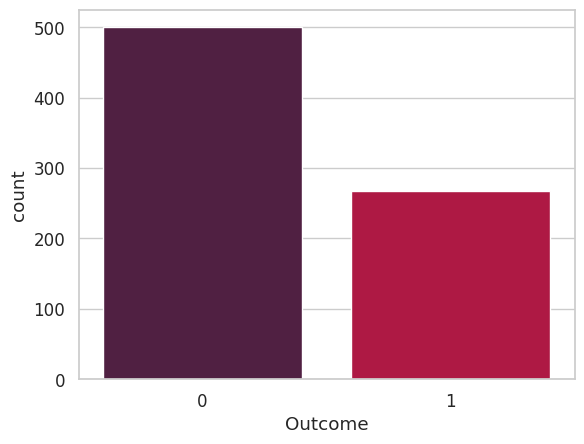

In [35]:
#Verificando a distribuição dos dados com pacientes com não diabetes e diabeticos
# Resultado 0 indica pacientes não diabéticos e 1 os pacientes diabéticos
sns.countplot(x=diabetes["Outcome"])

In [36]:
#Agrupando casos dos não diabéticos e os diabéticos
diabetes.groupby('Outcome').mean()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Outcome,,,,,,,,
0,3.30,109.98,68.18,19.66,68.79,30.30,0.43,31.19
1,4.87,141.26,70.82,22.16,100.34,35.14,0.55,37.07


In [37]:
diabetes[num_cols]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.60,0.63,50
1,1,85,66,29,0,26.60,0.35,31
2,8,183,64,0,0,23.30,0.67,32
3,1,89,66,23,94,28.10,0.17,21
4,0,137,40,35,168,43.10,2.29,33
...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.90,0.17,63
764,2,122,70,27,0,36.80,0.34,27
765,5,121,72,23,112,26.20,0.24,30
766,1,126,60,0,0,30.10,0.35,47


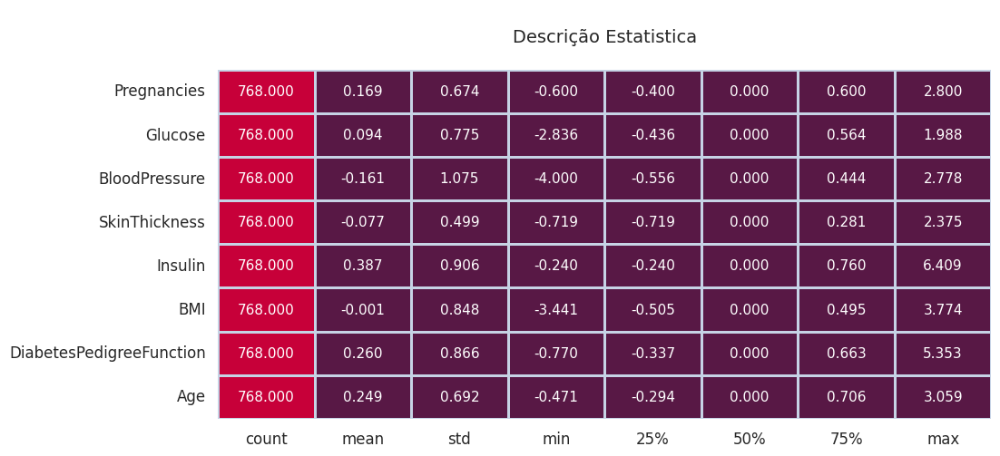

In [38]:
#lendo as colunas e plotando com a descrtiva estatística
rs = RobustScaler()
diabetes[num_cols] = rs.fit_transform(diabetes[num_cols])
descriptive_statistics(diabetes[num_cols])

In [39]:
#Verificação dos tipos inferidos para cada campo após a leitura
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    float64
 1   Glucose                   768 non-null    float64
 2   BloodPressure             768 non-null    float64
 3   SkinThickness             768 non-null    float64
 4   Insulin                   768 non-null    float64
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    float64
 8   Outcome                   768 non-null    int64  
dtypes: float64(8), int64(1)
memory usage: 54.1 KB


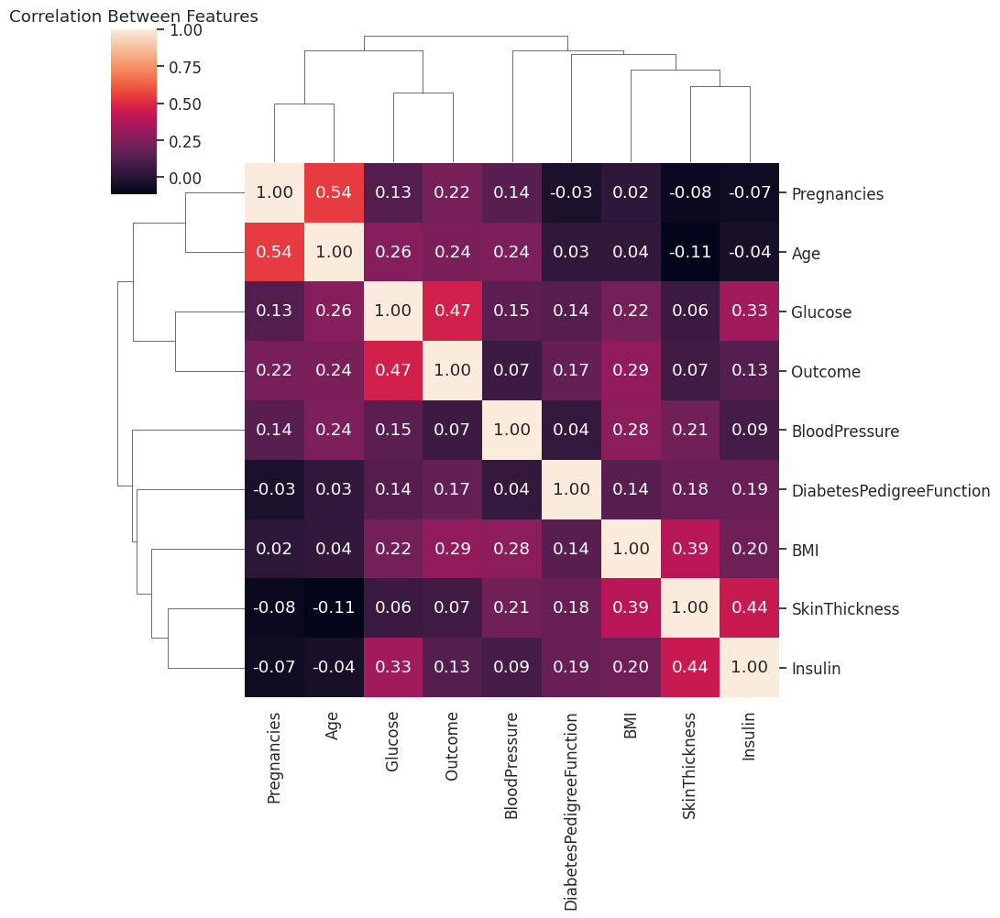

In [40]:

# Verificando a Correlação

corr_matrix = diabetes.corr()
sns.clustermap(corr_matrix, annot = True, fmt = ".2f")
plt.title("Correlation Between Features")
plt.show()

In [41]:
diabetes.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.00,768.00,768.00,768.00,768.00,768.00,768.00,768.00,768.00
mean,0.17,0.09,-0.16,-0.08,0.39,-0.00,0.26,0.25,0.35
std,0.67,0.78,1.08,0.50,0.91,0.85,0.87,0.69,0.48
min,-0.60,-2.84,-4.00,-0.72,-0.24,-3.44,-0.77,-0.47,0.00
25%,-0.40,-0.44,-0.56,-0.72,-0.24,-0.51,-0.34,-0.29,0.00
50%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
75%,0.60,0.56,0.44,0.28,0.76,0.49,0.66,0.71,1.00
max,2.80,1.99,2.78,2.38,6.41,3.77,5.35,3.06,1.00


**Iniciando Aprendizagem de Máquina**





In [42]:
import pandas_profiling
pandas_profiling.ProfileReport(diabetes)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [43]:
 # Rotulando os dados
 X=diabetes.drop(columns='Outcome',axis=1)
 Y=diabetes['Outcome']

In [44]:
#Deletando do Modelo a Coluna de Outcome com os resultados
print(X)



     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  DiabetesPedigreeFunction  \
0           0.60     0.75           0.00           0.38    -0.24  0.17                      0.67   
1          -0.40    -0.78          -0.33           0.19    -0.24 -0.58                     -0.06   
2           1.00     1.60          -0.44          -0.72    -0.24 -0.94                      0.78   
3          -0.40    -0.68          -0.33           0.00     0.50 -0.42                     -0.54   
4          -0.60     0.48          -1.78           0.38     1.08  1.19                      5.01   
..           ...      ...            ...            ...      ...   ...                       ...   
763         1.40    -0.39           0.22           0.78     1.17  0.10                     -0.53   
764        -0.20     0.12          -0.11           0.12    -0.24  0.52                     -0.08   
765         0.40     0.10           0.00           0.00     0.64 -0.62                     -0.33   


In [45]:
# No rótulo Y adicionei o resultado 
print(Y)

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 768, dtype: int64


Avançando no Modelo de Regressão

In [46]:
#Usado no modelo RMSE (Root Mean Squared Error). 
import math
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

for _ in range(10):
    
    X_train, X_test, Y_train, Y_test = train_test_split(diabetes, diabetes, test_size=0.2)
    scaler = StandardScaler()
    scaled_X_train = scaler.fit_transform(X_train)
    scaled_X_test = scaler.transform(X_test)
    print()
    lin_reg = LinearRegression()
    lin_reg.fit(scaled_X_train, Y_train)
    print("Hyper-parameters:", lin_reg.intercept_, lin_reg.coef_)
    
    Y_pred_train = lin_reg.predict(scaled_X_train)
    Y_pred_test = lin_reg.predict(scaled_X_test)
    
    rmse_train = math.sqrt(mean_squared_error(Y_train, Y_pred_train))
    print("Train RMS:", rmse_train)
    
    rmse_test = math.sqrt(mean_squared_error(Y_test, Y_pred_test))
    print("Test RMS:", rmse_test)
    print("Difference:", rmse_test - rmse_train)


Hyper-parameters: [ 0.15765472  0.13586023 -0.15028954 -0.06402687  0.3905979  -0.00977199
  0.25763556  0.24276681  0.35016287] [[ 6.77054146e-01 -3.59560986e-17  7.69885175e-17 -1.15439526e-16
  -5.41981639e-17  2.28198048e-17 -1.77461944e-16  5.61850531e-17
  -7.01120339e-17]
 [-1.27054325e-16  7.72605399e-01  8.32667268e-17 -1.38777878e-17
   1.38777878e-16 -4.16333634e-17  5.15212872e-16  0.00000000e+00
   2.22044605e-16]
 [ 4.51547799e-16 -2.22044605e-16  1.07942897e+00 -2.56739074e-16
   2.87964097e-16 -2.92300906e-16  2.78856799e-16  3.05311332e-16
  -2.91433544e-16]
 [ 4.33323193e-17 -2.77555756e-17  9.54097912e-17  4.97545466e-01
   2.42861287e-17 -2.64545330e-17 -6.17995238e-17 -2.77555756e-17
  -1.11022302e-16]
 [-1.03150850e-16 -1.38777878e-17  2.22044605e-16 -1.09287579e-16
   8.82556076e-01  4.29777741e-16  7.15573434e-18 -5.55111512e-17
   2.77555756e-17]
 [ 1.95724964e-16 -2.98372438e-16 -3.64291930e-17  6.80878964e-17
   2.64979011e-16  8.72504126e-01  1.51246203e-16

In [47]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import math

repetition = 100
percentages = np.linspace(0.05, 0.95, 100)
mean_rmse_trains = []
mean_rmse_tests = []
ci_rmse_trains = []
ci_rmse_tests = []

for percentage in percentages:
  rmse_trains = []
  rmse_tests = []
  for _ in range(repetition):
    X_train, X_test, Y_train, Y_test = train_test_split(diabetes, diabetes, test_size=1.0-percentage)
    
    lin_reg = LinearRegression()
    lin_reg.fit(X_train, Y_train)
    
    Y_pred_train = lin_reg.predict(X_train)
    Y_pred_test = lin_reg.predict(X_test)
    
    rmse_train = math.sqrt(mean_squared_error(Y_train, Y_pred_train))
    rmse_test = math.sqrt(mean_squared_error(Y_test, Y_pred_test))
    
    rmse_trains.append(rmse_train)
    rmse_tests.append(rmse_test)
    
  mean_rmse_train = np.mean(rmse_trains)
  mean_rmse_test = np.mean(rmse_tests)
  ci_rmse_train = 1.96 * np.std(rmse_trains) / math.sqrt(repetition)
  ci_rmse_test = 1.96 * np.std(rmse_tests) / math.sqrt(repetition)
  
  mean_rmse_trains.append(mean_rmse_train)
  mean_rmse_tests.append(mean_rmse_test)
  ci_rmse_trains.append(ci_rmse_train)
  ci_rmse_tests.append(ci_rmse_test)



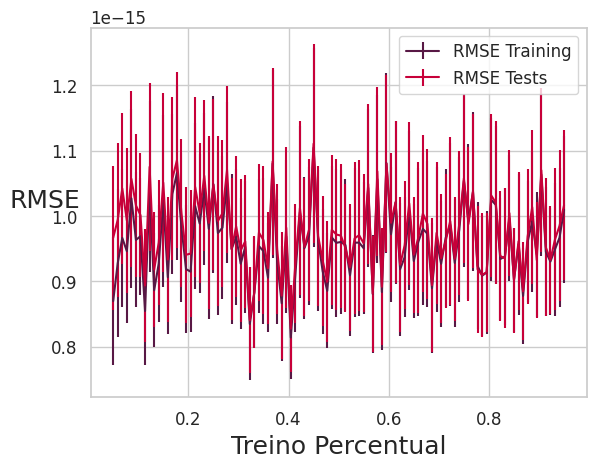

In [48]:
import matplotlib.pyplot as plt
plt.errorbar(percentages, mean_rmse_trains, yerr=ci_rmse_trains, label="RMSE Training")
plt.errorbar(percentages, mean_rmse_tests, yerr=ci_rmse_tests, label="RMSE Tests")

plt.xlabel("Treino Percentual", fontsize=18)
plt.ylabel("RMSE", fontsize=18, rotation=0)
plt.legend()
plt.show()

In [49]:
# Modelo Escalar de Treinamento do Modelo ML 
scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)

In [50]:
# Dividindo X e Y em dados de treino e de teste
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, stratify=Y, random_state=2)

In [51]:
# Fazendo o fit com os dados
scaler.fit(X)

StandardScaler()

In [52]:
#Imprimindo o shape dos datasets
print(X.shape, X_train.shape, X_test.shape)

(768, 8) (537, 8) (231, 8)


SVM

>SUPPORT VETOR MACHINE 



In [53]:
classifier=svm.SVC(kernel='linear')
#Treinando um Modelo de Vetor e Classificação 
classifier.fit(X_train,Y_train)

SVC(kernel='linear')

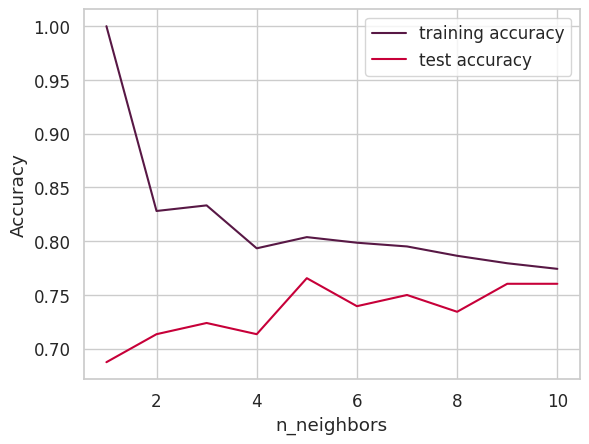

In [54]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(diabetes.loc[:, diabetes.columns != 'Outcome'], diabetes['Outcome'], stratify=diabetes['Outcome'], random_state=66)
from sklearn.neighbors import KNeighborsClassifier
training_accuracy = []
test_accuracy = []
# n_neighbors from 1 to 10
neighbors_settings = range(1, 11)
for n_neighbors in neighbors_settings:
    # Construindo o Modelo 
    knn = KNeighborsClassifier(n_neighbors=n_neighbors)
    knn.fit(X_train, y_train)
    # Gravando acurancia
    training_accuracy.append(knn.score(X_train, y_train))
    # Gravando acuracia de testes
    test_accuracy.append(knn.score(X_test, y_test))
plt.plot(neighbors_settings, training_accuracy, label="training accuracy")
plt.plot(neighbors_settings, test_accuracy, label="test accuracy")
plt.ylabel("Accuracy")
plt.xlabel("n_neighbors")
plt.legend()
plt.savefig('knn_compare_model')

In [55]:
#“Support Vector Machine” (SVM) é um algoritmo de aprendizado de máquina
#supervisionado que pode ser usado para desafios de classificação ou regressão.
#Seu foco maior é no treinamento e classificação de um dataset.
from sklearn.svm import SVC

svc_model = SVC()
svc_model.fit(X_train, y_train)

SVC()

In [56]:
svc_pred = svc_model.predict(X_test)

In [57]:
svc_pred 

array([1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0,
       0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0])

In [58]:
#Modelo KDD
knn = KNeighborsClassifier(n_neighbors=9)
knn.fit(X_train, y_train)
print('Acuracia do K-NN classificador para Treinamento : {:.2f}'.format(knn.score(X_train, y_train)))
print('Acuracia do K-NN classificador para Teste: {:.2f}'.format(knn.score(X_test, y_test)))

Acuracia do K-NN classificador para Treinamento : 0.78
Acuracia do K-NN classificador para Teste: 0.76


In [59]:
## Regressão Logistica
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression().fit(X_train, y_train)
print("Treinameto : {:.3f}".format(logreg.score(X_train, y_train)))
print("Teste: {:.3f}".format(logreg.score(X_test, y_test)))

Treinameto : 0.788
Teste: 0.766


In [60]:
#Arvore de Decisao 
#Possibilidade de uso do modelo de ML
from sklearn.tree import DecisionTreeClassifier
tree = DecisionTreeClassifier(random_state=0)
tree.fit(X_train, y_train)
print("Treinameto: {:.3f}".format(tree.score(X_train, y_train)))
print("Teste: {:.3f}".format(tree.score(X_test, y_test)))

Treinameto: 1.000
Teste: 0.714


In [61]:
from sklearn.ensemble import GradientBoostingClassifier
gb = GradientBoostingClassifier(random_state=0)
gb.fit(X_train, y_train)
print("Treinamento: {:.3f}".format(gb.score(X_train, y_train)))
print("Teste: {:.3f}".format(gb.score(X_test, y_test)))

Treinamento: 0.917
Teste: 0.786


In [62]:
from sklearn import metrics

print("Acurácia Atingida no Modelo foi  =", format(metrics.accuracy_score(y_test, svc_pred)))

Acurácia Atingida no Modelo foi  = 0.78125


In [63]:
logreg001 = LogisticRegression(C=0.01).fit(X_train, y_train)
print("Treinamento: {:.3f}".format(logreg001.score(X_train, y_train)))
print("Teste: {:.3f}".format(logreg001.score(X_test, y_test)))

Treinamento: 0.753
Teste: 0.755


In [64]:
#Regressao Logistica com c = 100 
logreg100 = LogisticRegression(C=100).fit(X_train, y_train)
print("Treinameto: {:.3f}".format(logreg100.score(X_train, y_train)))
print("Teste: {:.3f}".format(logreg100.score(X_test, y_test)))

Treinameto: 0.785
Teste: 0.766


In [70]:
print("Feature importances:\n{}".format(tree.feature_importances_))

Feature importances:
[0.05477652 0.28215943 0.08796796 0.05542765 0.07278587 0.20684233
 0.12670183 0.1133384 ]


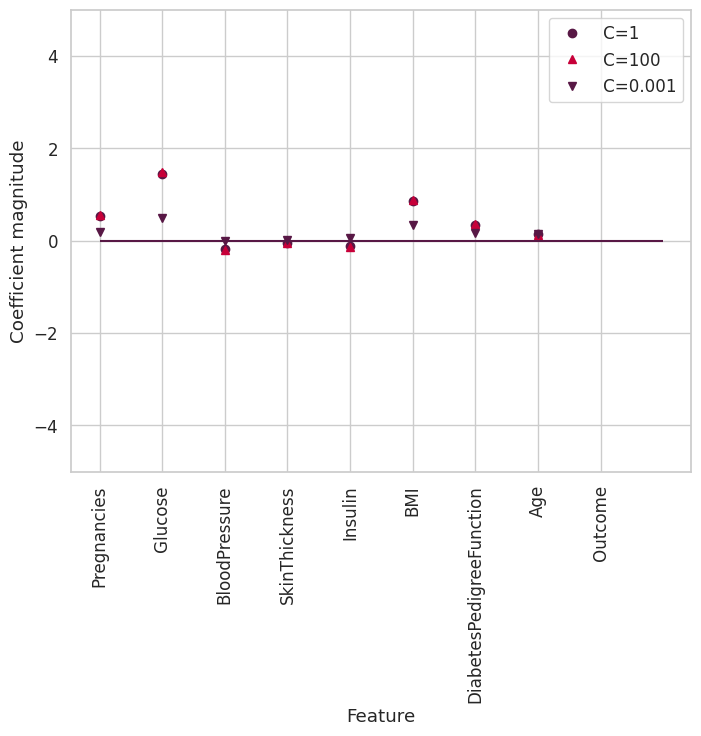

In [83]:
import numpy as np
import matplotlib.pyplot as plt
diabetes_features = [x for i,x in enumerate(diabetes.columns) if i!=9]
plt.figure(figsize=(8,6))
plt.plot(logreg.coef_.T, 'o', label="C=1")
plt.plot(logreg100.coef_.T, '^', label="C=100")
plt.plot(logreg001.coef_.T, 'v', label="C=0.001")
plt.xticks(range(diabetes.shape[1]), diabetes_features, rotation=90)
plt.hlines(0, 0, diabetes.shape[1])
plt.ylim(-5, 5)
plt.xlabel("Feature")
plt.ylabel("Coefficient magnitude")
plt.legend()
plt.savefig('log_coef')

In [84]:
#Matrix de  Confusão  
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(y_test, svc_pred))
print(classification_report(y_test,svc_pred))

[[110  15]
 [ 27  40]]
              precision    recall  f1-score   support

           0       0.80      0.88      0.84       125
           1       0.73      0.60      0.66        67

    accuracy                           0.78       192
   macro avg       0.77      0.74      0.75       192
weighted avg       0.78      0.78      0.78       192



In [74]:
from sklearn.svm import SVC
svc = SVC()
svc.fit(X_train, y_train)
print("Treinamento : {:.2f}".format(svc.score(X_train, y_train)))
print("Testes: {:.2f}".format(svc.score(X_test, y_test)))

Treinamento : 0.81
Testes: 0.78


**APRENDIZAGEM PROFUNDA**

In [71]:
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(random_state=42)
mlp.fit(X_train, y_train)
print("Accuracy on training set: {:.2f}".format(mlp.score(X_train, y_train)))
print("Accuracy on test set: {:.2f}".format(mlp.score(X_test, y_test)))

Accuracy on training set: 0.81
Accuracy on test set: 0.80
